<a href="https://colab.research.google.com/github/devin-sachs/C961-WGU-Capstone/blob/main/Capstone_Devin_Sachs_Logisitic_Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import kagglehub
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import folium
import branca
from folium.plugins import HeatMap
from datetime import datetime
from sklearn.utils import resample
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, auc
import ipywidgets as widgets
from ipywidgets import interactive
from IPython.display import display, clear_output


# Download latest version of the dataset
path = kagglehub.dataset_download("michaellindsay/portland-crime")

#Confirming paths
print("Path to dataset files:", path)
print(path + "/output.csv")

Path to dataset files: /root/.cache/kagglehub/datasets/michaellindsay/portland-crime/versions/5
/root/.cache/kagglehub/datasets/michaellindsay/portland-crime/versions/5/output.csv


In [ ]:
#load the datset

df = pd.read_csv(path + "/output.csv", delimiter="\t")
display(df)

# df.head()


,Unnamed: 0,Address,CaseNumber,CrimeAgainst,Neighborhood,OccurDate,OccurTime,OffenseCategory,OffenseType,OpenDataLat,OpenDataLon,OpenDataX,OpenDataY,ReportDate,OffenseCount
0,492134,6300 BLOCK OF N LOMBARD ST,23-917974,Property,University Park,2023-07-31,1926,Larceny Offenses,Shoplifting,45.585250,-122.731728,7630813.0,707361.0,2023-07-31,1
1,474760,600 BLOCK OF SE 146TH AVE,23-200198,Property,Centennial,2023-07-31,555,Motor Vehicle Theft,Motor Vehicle Theft,45.517729,-122.513341,7686091.0,681281.0,2023-07-31,1
2,475814,700 BLOCK OF SW 10TH AVE,23-917935,Property,Downtown,2023-07-31,1110,Larceny Offenses,Theft From Motor Vehicle,45.519658,-122.682225,7642836.0,683108.0,2023-07-31,1
3,499387,14000 BLOCK OF NE AIRPORT WAY,23-917921,Property,Argay,2023-07-31,900,Larceny Offenses,Theft of Motor Vehicle Parts or Accessories,45.561735,-122.518390,7685198.0,697353.0,2023-07-31,1
4,475599,700 BLOCK OF SW 5TH AVE,23-200558,Person,Downtown,2023-07-31,1601,Assault Offenses,Simple Assault,45.518452,-122.677706,7643982.0,682637.0,2023-07-31,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
505058,22964,5400 BLOCK OF SW VIEW POINT TER,15-654432,Property,South Portland,2015-05-01,2200,Larceny Offenses,Theft From Motor Vehicle,45.484172,-122.677847,7643609.0,670144.0,2015-05-01,1
505059,37651,W BURNSIDE ST / SW 5TH AVE,15-143681,Property,Downtown,2015-05-01,1600,Vandalism,Vandalism,45.523080,-122.675409,7644616.0,684308.0,2015-05-01,1
505060,6189,400 BLOCK OF SW SALMON ST,15-140697,Property,Downtown,2015-05-01,1600,Vandalism,Vandalism,45.516624,-122.678174,7643844.0,681974.0,2015-05-01,1
505061,13877,1900 BLOCK OF SE 6TH AVE,15-654389,Property,Hosford-Abernethy,2015-05-01,1255,Vandalism,Vandalism,45.509024,-122.659847,7648466.0,679078.0,2015-05-01,1


In [ ]:
df.describe()

,Unnamed: 0,OccurTime,OpenDataLat,OpenDataLon,OpenDataX,OpenDataY,OffenseCount
count,505063.000000,505063.000000,451130.000000,451130.000000,4.511300e+05,451130.000000,505063.000000
mean,252531.000000,1293.676333,45.526630,-122.629344,7.656455e+06,685293.693370,1.016107
std,145799.273841,696.312996,0.032551,0.063702,1.623930e+04,11985.630531,0.162190
min,0.000000,0.000000,45.252157,-123.199225,7.517548e+06,585647.000000,1.000000
25%,126265.500000,800.000000,45.506868,-122.678889,7.643795e+06,677969.250000,1.000000
50%,252531.000000,1400.000000,45.523402,-122.645784,7.652174e+06,684312.000000,1.000000
75%,378796.500000,1900.000000,45.543094,-122.578231,7.669592e+06,691258.000000,1.000000
max,505062.000000,2359.000000,46.107895,-122.115872,7.788385e+06,901488.000000,19.000000


In [ ]:
missing_values = df.isnull().sum()
print(missing_values)

Unnamed: 0             0
Address            42722
CaseNumber             0
CrimeAgainst           0
Neighborhood       16635
OccurDate              0
OccurTime              0
OffenseCategory        0
OffenseType            0
OpenDataLat        53933
OpenDataLon        53933
OpenDataX          53933
OpenDataY          53933
ReportDate             0
OffenseCount           0
dtype: int64


In [ ]:
#Identify missing lat / long data rows
missing_lat_long = df[(df["OpenDataLat"].isnull()) | (df["OpenDataLon"].isnull())]

#Calculate mean lat/long values based on neighborhood
neighborhood_means = df.groupby("Neighborhood")[["OpenDataLat", "OpenDataLon"]].mean()

#function to fill missing lat/long data based on neighborhood
def impute_lat_lon(row):
  if pd.isnull(row["OpenDataLat"]) or pd.isnull(row["OpenDataLon"]):
    neighborhood = row["Neighborhood"]
    if neighborhood in neighborhood_means.index:
      row["OpenDataLat"] = neighborhood_means.loc[neighborhood, "OpenDataLat"]
      row["OpenDataLon"] = neighborhood_means.loc[neighborhood, "OpenDataLon"]
  return row

df = df.apply(impute_lat_lon, axis = 1)

default_lat = 45.523064
default_lon = -122.676483

#Below is code to fill in missing data, this is not neccesary but leaving here
#In case it is needed in the future. For now these are ignored in the heatmap
#the heatmap is the only place this is used so far
#####
# Fill missing lat/long data with default values
# df["OpenDataLat"] = df["OpenDataLat"].fillna(default_lat)
# df["OpenDataLon"] = df["OpenDataLon"].fillna(default_lon)

# Fill missing categorical data with the mode
# categorical_cols = df.select_dtypes(include=['object']).columns
# for col in categorical_cols:
#     if df[col].isnull().sum() > 0:
#         df[col] = df[col].fillna(df[col].mode()[0])
#####
missing_values = df.isnull().sum()
print(missing_values)

Unnamed: 0             0
Address            42722
CaseNumber             0
CrimeAgainst           0
Neighborhood       16635
OccurDate              0
OccurTime              0
OffenseCategory        0
OffenseType            0
OpenDataLat         9318
OpenDataLon         9318
OpenDataX          53933
OpenDataY          53933
ReportDate             0
OffenseCount           0
dtype: int64


In [ ]:

df = df.drop(columns=['CaseNumber', 'Address', 'OpenDataX', 'OpenDataY'])

display(df)

,Unnamed: 0,CrimeAgainst,Neighborhood,OccurDate,OccurTime,OffenseCategory,OffenseType,OpenDataLat,OpenDataLon,ReportDate,OffenseCount
0,492134,Property,University Park,2023-07-31,1926,Larceny Offenses,Shoplifting,45.585250,-122.731728,2023-07-31,1
1,474760,Property,Centennial,2023-07-31,555,Motor Vehicle Theft,Motor Vehicle Theft,45.517729,-122.513341,2023-07-31,1
2,475814,Property,Downtown,2023-07-31,1110,Larceny Offenses,Theft From Motor Vehicle,45.519658,-122.682225,2023-07-31,1
3,499387,Property,Argay,2023-07-31,900,Larceny Offenses,Theft of Motor Vehicle Parts or Accessories,45.561735,-122.518390,2023-07-31,1
4,475599,Person,Downtown,2023-07-31,1601,Assault Offenses,Simple Assault,45.518452,-122.677706,2023-07-31,1
...,...,...,...,...,...,...,...,...,...,...,...
505058,22964,Property,South Portland,2015-05-01,2200,Larceny Offenses,Theft From Motor Vehicle,45.484172,-122.677847,2015-05-01,1
505059,37651,Property,Downtown,2015-05-01,1600,Vandalism,Vandalism,45.523080,-122.675409,2015-05-01,1
505060,6189,Property,Downtown,2015-05-01,1600,Vandalism,Vandalism,45.516624,-122.678174,2015-05-01,1
505061,13877,Property,Hosford-Abernethy,2015-05-01,1255,Vandalism,Vandalism,45.509024,-122.659847,2015-05-01,1


In [ ]:
print(df.columns)
print(df["OffenseType"].value_counts())
print(df['OffenseCategory'].value_counts())

Index(['Unnamed: 0', 'CrimeAgainst', 'Neighborhood', 'OccurDate', 'OccurTime',
       'OffenseCategory', 'OffenseType', 'OpenDataLat', 'OpenDataLon',
       'ReportDate', 'OffenseCount'],
      dtype='object')
OffenseType
Theft From Motor Vehicle                       80363
Vandalism                                      65600
Motor Vehicle Theft                            60713
All Other Larceny                              54981
Burglary                                       38708
Simple Assault                                 36874
Shoplifting                                    29756
Theft of Motor Vehicle Parts or Accessories    20244
Aggravated Assault                             17573
Theft From Building                            13508
Identity Theft                                 12927
False Pretenses/Swindle/Confidence Game        11179
Drug/Narcotic Violations                       10375
Intimidation                                    9875
Robbery                             

In [ ]:
#OffenseType is too granular, dropping it for now to clean data up
df = df.drop(columns=["OffenseType", "Unnamed: 0"])

In [ ]:
#Convert OccurDate to datetime
df["OccurDate"] = pd.to_datetime(df["OccurDate"], errors = "coerce")

#Add new feature fields for further granularity about occurence date/time
df["DayOfWeek"] = df["OccurDate"].dt.day_name()
df["OccurMonth"] = df["OccurDate"].dt.month
df["OccurYear"] = df["OccurDate"].dt.year

#Ensures all times have four characters and are in %HH%MM format
df["OccurTime"] = df["OccurTime"].astype(str).str.zfill(4)
df["OccurTime"] = df["OccurTime"].str[:2] + ":" + df["OccurTime"].str[2:]

#Convert OccurTime to datetime
df["OccurTime"] = df["OccurTime"].apply(lambda x: datetime.strptime(x, "%H:%M").time())

#Extract hour and categorize time of day
df["OccurHour"] = df["OccurTime"].apply(lambda x: x.hour)

df['TimeOfDay'] = pd.cut(df['OccurHour'], bins=[0, 6, 12, 18, 24],
                             labels=['Night', 'Morning', 'Afternoon', 'Evening'])




In [ ]:
df = df.dropna(subset=['OccurTime'])
df = df.dropna(subset=['OpenDataLat'])

In [ ]:
# Unique combinations of days, time categories, and neighborhoods
unique_combinations = pd.MultiIndex.from_product([
    df['DayOfWeek'].unique(),
    df['TimeOfDay'].unique(),
    df['Neighborhood'].unique()
], names=['DayOfWeek', 'TimeOfDay', 'Neighborhood'])



In [ ]:
# Group by day, time, and neighborhood to count crimes
crime_counts = df.groupby(['DayOfWeek', 'TimeOfDay', 'Neighborhood'], observed = False).size()
crime_counts = crime_counts.reindex(unique_combinations, fill_value=0)  # Fill missing combinations with zero


In [ ]:
# Reset the index to create a DataFrame
crime_data = crime_counts.reset_index(name='Crime')

# Create a binary column for crime occurrence (1 if >0, else 0)
crime_data['Crime'] = crime_data['Crime'].apply(lambda x: 1 if x > 0 else 0)


In [ ]:
display(crime_data)

,DayOfWeek,TimeOfDay,Neighborhood,Crime
0,Monday,Evening,University Park,1
1,Monday,Evening,Centennial,1
2,Monday,Evening,Downtown,1
3,Monday,Evening,Argay,1
4,Monday,Evening,Old Town/Chinatown,1
...,...,...,...,...
3390,Tuesday,NaN,Woodland Park,0
3391,Tuesday,NaN,Arnold Creek,0
3392,Tuesday,NaN,Collins View,0
3393,Tuesday,NaN,Healy Heights,0


In [ ]:
#Resample so that there is a more even distribution of data, the no crime cases I added to the dataset are not enough
#to give it a fair review of crime vs no crime



#Seperate min and maj classes
minority = crime_data[crime_data['Crime'] == 0]
majority = crime_data[crime_data['Crime'] == 1]

#Oversample minority class
minority_oversampled = resample(minority,
                                replace = True,
                                n_samples = len(majority),
                                random_state = 42)

balanced_data = pd.concat([majority, minority_oversampled])

#Shuffle the data
balanced_data = balanced_data.sample(frac = 1, random_state = 42).reset_index(drop = True)

print(balanced_data['Crime'].value_counts())

Crime
0    2678
1    2678
Name: count, dtype: int64


In [ ]:
categorical_columns = ['DayOfWeek', 'TimeOfDay', 'Neighborhood']  # Adjust based on your data
encoded_data = pd.get_dummies(balanced_data, columns=categorical_columns, drop_first=True)

In [ ]:
# Re-encode categorical variables for model training
# crime_data = pd.get_dummies(crime_data, columns=['DayOfWeek', 'TimeOfDay', 'Neighborhood'], drop_first=True)

# Define features (X) and target (y)
X = encoded_data.drop(columns=['Crime'])
y = encoded_data['Crime']

In [ ]:
# display(balanced_data)
display(X)
display(y)

,DayOfWeek_Monday,DayOfWeek_Saturday,DayOfWeek_Sunday,DayOfWeek_Thursday,DayOfWeek_Tuesday,DayOfWeek_Wednesday,TimeOfDay_Morning,TimeOfDay_Afternoon,TimeOfDay_Evening,Neighborhood_Arbor Lodge,...,Neighborhood_Sunderland,Neighborhood_Sunnyside,Neighborhood_Sylvan-Highlands,Neighborhood_University Park,Neighborhood_Vernon,Neighborhood_West Portland Park,Neighborhood_Wilkes,Neighborhood_Woodland Park,Neighborhood_Woodlawn,Neighborhood_Woodstock
0,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,True,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
3,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5351,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
5352,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
5353,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
5354,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


,Crime
0,0
1,1
2,1
3,0
4,1
...,...
5351,0
5352,0
5353,0
5354,0


In [ ]:
# #Train-Test split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# #Logistic Regression model

model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

#Predict and Evaluate

y_pred = model.predict(X_test)

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print("ROC-AUC-Score:", roc_auc_score(y_test, model.predict_proba(X_test)[:,1]))


              precision    recall  f1-score   support

           0       0.79      0.96      0.87       533
           1       0.95      0.75      0.84       539

    accuracy                           0.86      1072
   macro avg       0.87      0.86      0.85      1072
weighted avg       0.87      0.86      0.85      1072

[[514  19]
 [136 403]]
ROC-AUC-Score: 0.833523619237905


In [ ]:
print(y.value_counts())

Crime
0    2678
1    2678
Name: count, dtype: int64


In [ ]:
def predict_crime(neighborhood, day_of_week, time_of_day):
    # Create a DataFrame with the input values as binary indicators
    input_data = {
        "DayOfWeek_" + day_of_week: 1,
        "TimeOfDay_" + time_of_day: 1,
        "Neighborhood_" + neighborhood: 1
    }

    input_encoded = pd.DataFrame([input_data])

    # Efficiently add missing columns (if any) by using a more efficient method
    missing_cols = set(X.columns) - set(input_encoded.columns)

    # Convert missing_cols to a list
    missing_cols = list(missing_cols)

    missing_data = pd.DataFrame(0, index=input_encoded.index, columns=missing_cols)

    # Concatenate the missing columns in a single step to avoid fragmentation
    input_encoded = pd.concat([input_encoded, missing_data], axis=1)

    # Reorder columns to match the model's training data
    input_encoded = input_encoded[X.columns]

    # Predict the probability of crime occurring
    probability = model.predict_proba(input_encoded)[0][1]

    return f"Chance of crime occurring: {probability * 100:.2f}%"

In [ ]:
# Example user input
neighborhood = 'Powellhurst-Gilbert'
day_of_week = 'Sunday'
time_category = 'Evening'

result = predict_crime(neighborhood, day_of_week, time_category)
print(result)

Chance of crime occurring: 95.75%


In [ ]:
neighborhoods = df['Neighborhood'].unique()
neighborhoods_cleaned = neighborhoods[~pd.isna(neighborhoods)].tolist()
# display(neighborhoods_cleaned)

days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
times_of_day = ['Night', 'Morning', 'Afternoon', 'Evening']

# Create dropdowns for each input
neighborhood_dropdown = widgets.Dropdown(
    options=neighborhoods_cleaned,
    description='Neighborhood:',
    disabled=False
)

day_of_week_dropdown = widgets.Dropdown(
    options=days_of_week,
    description='Day of Week:',
    disabled=False
)

time_of_day_dropdown = widgets.Dropdown(
    options=times_of_day,
    description='Time of Day:',
    disabled=False
)

# Output area to display result
output = widgets.Output()

# Function to display result after button click
def on_button_click(b):
    # Clear output first to avoid clutter
    clear_output(wait=True)
    display(neighborhood_dropdown, day_of_week_dropdown, time_of_day_dropdown, button, output)
    with output:
        result = predict_crime(
            neighborhood = neighborhood_dropdown.value,
            day_of_week = day_of_week_dropdown.value,
            time_of_day = time_of_day_dropdown.value
        )
        clear_output(wait=True)
        print(result)

# Create button
# Connect the button to the function
button = widgets.Button(description="Predict Crime Probability")
button.on_click(on_button_click)

# clear_button = widgets.Button(description="Clear Output")
# clear_button.on_click(clear_button_click)

# Display the widgets
display(neighborhood_dropdown, day_of_week_dropdown, time_of_day_dropdown, button, output)

Dropdown(description='Neighborhood:', options=('University Park', 'Centennial', 'Downtown', 'Argay', 'Old Town…

Dropdown(description='Day of Week:', options=('Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturda…

Dropdown(description='Time of Day:', options=('Night', 'Morning', 'Afternoon', 'Evening'), value='Night')

Button(description='Predict Crime Probability', style=ButtonStyle())

Output()

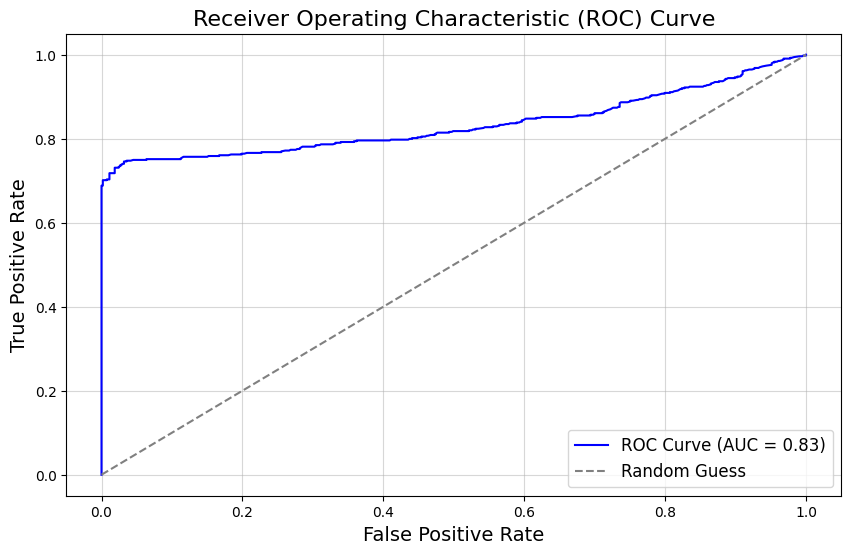

In [ ]:
# Predict probabilities for the test set
y_probs = model.predict_proba(X_test)[:, 1]

# Compute ROC curve and ROC-AUC score
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Random Guess')
plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=16)
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.legend(loc='lower right', fontsize=12)
plt.grid(alpha=0.5)
plt.show()

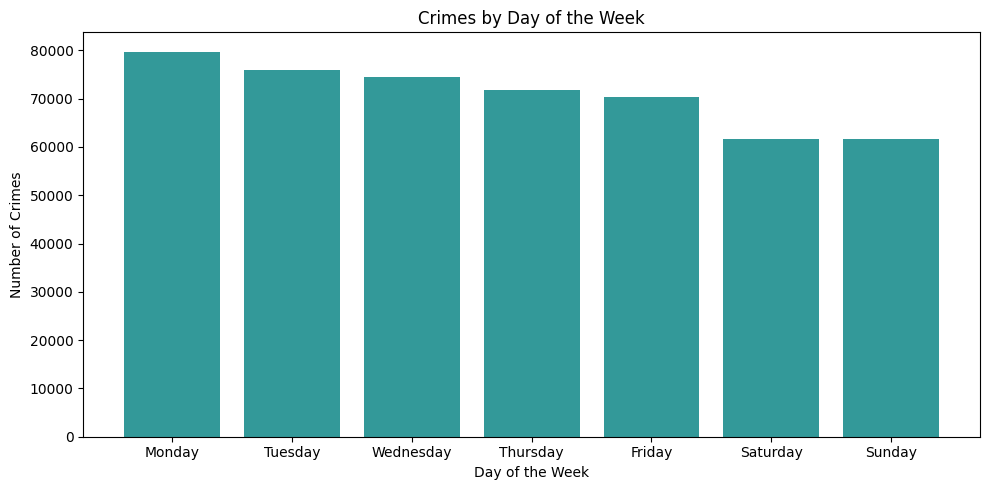

In [ ]:
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Count the occurrences of each day of the week
day_counts = df['DayOfWeek'].value_counts()[day_order]

# Plot the distribution
plt.figure(figsize=(10, 5))
plt.bar(day_counts.index, day_counts.values, color='teal', alpha=0.8)
plt.title('Crimes by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Crimes')
plt.tight_layout()
plt.show()

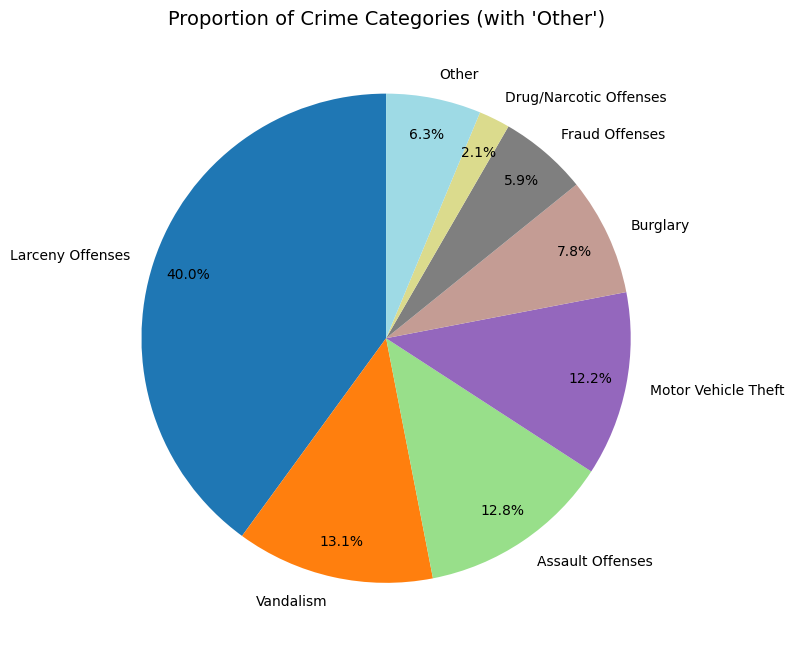

In [ ]:
#Pie Chart - Proportions of Crime Categories with 'Other'**
offense_proportions = df["OffenseCategory"].value_counts(normalize=True)

# Set a threshold for smaller categories
threshold = 0.02  # Combine categories with < 2% of total crimes
large_categories = offense_proportions[offense_proportions >= threshold]
small_categories_sum = offense_proportions[offense_proportions < threshold].sum()

# Create a new series with "Other"
offense_proportions_combined = pd.concat([large_categories, pd.Series({"Other": small_categories_sum})])

# Plot pie chart
plt.figure(figsize=(8, 8))
offense_proportions_combined.plot.pie(
    autopct='%1.1f%%',
    startangle=90,
    colormap="tab20",
    pctdistance=0.85
)
plt.title("Proportion of Crime Categories (with 'Other')", fontsize=14)
plt.ylabel("")  # Hide y-axis label
plt.tight_layout()
plt.show()

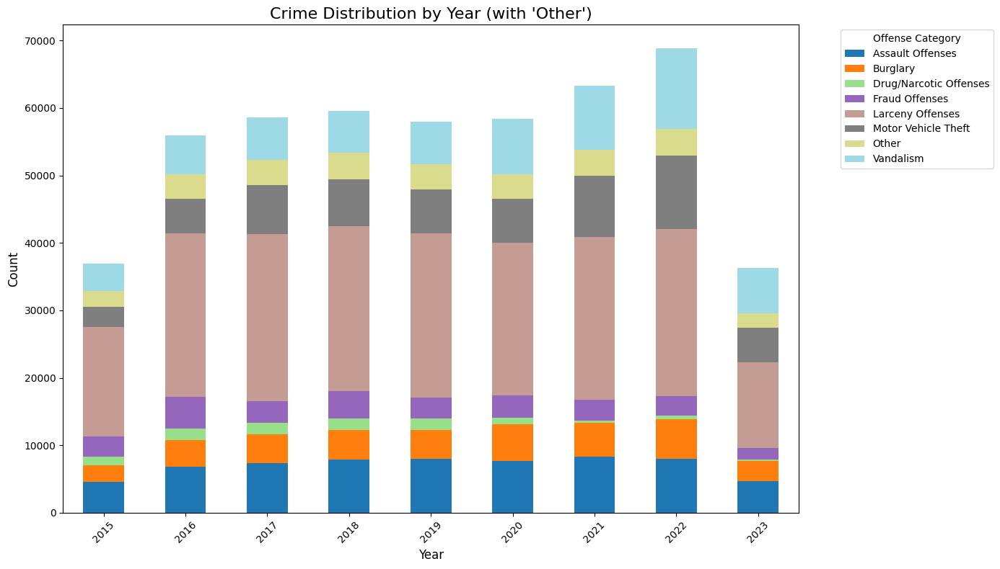

In [ ]:
#Stacked Bar Chart by Year (with 'Other')**
#Now we add 'Other' for smaller categories to the stacked bar chart.
#Combine categories under the threshold to 'Other'
df['OffenseCategoryCombined'] = df['OffenseCategory'].apply(
    lambda x: x if offense_proportions[x] >= threshold else 'Other'
)

# Group data by year and the combined offense category
category_year_combined_counts = df.groupby(['OccurYear', 'OffenseCategoryCombined']).size().unstack(fill_value=0)

# Plot the combined stacked bar chart
category_year_combined_counts.plot(kind='bar', stacked=True, figsize=(14, 8), colormap="tab20")
plt.title("Crime Distribution by Year (with 'Other')", fontsize=16)
plt.ylabel("Count", fontsize=12)
plt.xlabel("Year", fontsize=12)
plt.legend(title="Offense Category", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
# Create a crime map
crime_map = folium.Map(location=[45.5152, -122.6784], zoom_start=12)

# Prepare heatmap data
heat_data = df[["OpenDataLat", "OpenDataLon"]].dropna()

# Add heatmap to the map
HeatMap(heat_data.values, radius=11).add_to(crime_map)

# Add a legend to the map
legend_html = """
<div style="
    position: fixed;
    bottom: 50px; left: 50px; width: 250px; height: 120px;
    background-color: white; border:2px solid grey; z-index:9999;
    font-size:14px;
    padding: 10px;
">
    <strong>Heatmap Legend</strong><br>
    <i style="background: rgba(255, 0, 0, 0.6); width: 20px; height: 20px; display: inline-block;"></i> High Density<br>
    <i style="background: rgba(255, 165, 0, 0.6); width: 20px; height: 20px; display: inline-block;"></i> Medium Density<br>
    <i style="background: rgba(0, 0, 255, 0.6); width: 20px; height: 20px; display: inline-block;"></i> Low Density
</div>
"""
crime_map.get_root().html.add_child(folium.Element(legend_html))

# Display the crime map
crime_map
